In [1]:
import pathlib
import numpy as np
import scipy as sp
import pandas as pd
from matplotlib import pyplot as plt
import astropy as ast
from astropy import stats

import SessionTools.two_photon as st2p


plt.rcParams['pdf.fonttype']=42

%load_ext autoreload
%autoreload 2 


%matplotlib inline

In [2]:
basedir = pathlib.Path('/media/mplitt/SSD_storage/2P_scratch/R18B05LexA_CsChrimsontdT_R60D05Gal4_jGCaMP7f/remapping')
sess_df = pd.read_csv(basedir / 'sessions.csv')
sess_df = sess_df.iloc[:-1]
print(sess_df.columns)
sess_df['fly_id'] = [row['date']+'_'+row['fly'] +'_' + row['condition'] for _, row in sess_df.iterrows()]
sess_df['mean offset'] = [np.nan for _, row in sess_df.iterrows()]
sess_df['offset var.'] = [np.nan for _, row in sess_df.iterrows()]
sess_df['mean vec. len'] = [np.nan for _, row in sess_df.iterrows()]


figfolder = pathlib.Path('/media/mplitt/SSD_storage/fig_scratch/R18B05LexA_CsChrimsontdT_R60D05Gal4_jGCaMP7f')
figfolder.mkdir(parents=True, exist_ok=True)

# sess_df = sess_df.loc[sess_df['usable']==1]

Index(['date', 'fly', 'sess', 'fictrac_scan_num', 'fictrac_file', 'condition',
       'scan_type', 'usable', 'notes'],
      dtype='object')


In [3]:
sess_df.head()

,date,fly,sess,fictrac_scan_num,fictrac_file,condition,scan_type,usable,notes,fly_id,mean offset,offset var.,mean vec. len
0,11_07_2024,fly1,baseline-000,0.0,fictrac-20240711_112205.dat,remap,baseline,NaN,NaN,11_07_2024_fly1_remap,NaN,NaN,NaN
1,11_07_2024,fly1,remap_0deg-001,1.0,fictrac-20240711_112205.dat,remap,remap_0deg,NaN,NaN,11_07_2024_fly1_remap,NaN,NaN,NaN
2,11_07_2024,fly1,post_0deg-002,2.0,fictrac-20240711_112205.dat,remap,post_0deg,NaN,NaN,11_07_2024_fly1_remap,NaN,NaN,NaN
3,11_07_2024,fly1,remap_180deg-004,4.0,fictrac-20240711_112205.dat,remap,remap_180deg,NaN,NaN,11_07_2024_fly1_remap,NaN,NaN,NaN
4,11_07_2024,fly1,post_180deg-006,6.0,fictrac-20240711_112205.dat,remap,post_180deg,NaN,NaN,11_07_2024_fly1_remap,NaN,NaN,NaN


In [4]:
for index,row in sess_df.iterrows():
    outdir = pathlib.PurePath( basedir / row['condition'] / row['date'] / row['fly'] / row['sess'] / 'preprocess.pkl')
    pp = st2p.preprocessing.EBImagingSession.from_file(outdir)
    dff = pp.calculate_zscored_F('rois', exp_detrend=True, zscore=False, background_ts='background')[-1,:,:] -1
    
    heading = np.angle(np.exp(1j*(-1*pp.voltage_recording_aligned[' Heading'].to_numpy()-np.pi)))
    h_mask = np.abs(heading)<2.5
        
        
    x_f,y_f = st2p.utilities.pol2cart(dff ,np.linspace(-np.pi,np.pi,num=dff.shape[0])[:,np.newaxis])
    rho,phi = st2p.utilities.cart2pol(x_f.mean(axis=0), y_f.mean(axis=0))

    _,offset = st2p.utilities.cart2pol(*st2p.utilities.pol2cart(np.ones(heading.shape),phi-heading))
    # print(offset.shape)
    
    
    x_o, y_o = st2p.utilities.pol2cart(np.ones(heading[h_mask].shape), offset[h_mask])
    r, offset_mu = st2p.utilities.cart2pol(x_o.mean(), y_o.mean())
    
    sess_df.loc[index, 'mean offset'] = offset_mu
    sess_df.loc[index, 'mean vec. len'] = r
    sess_df.loc[index, 'offset var.'] = sp.stats.circvar(offset[h_mask])


In [5]:
remap_sess_df = sess_df[sess_df['condition']=='remap']
flies = remap_sess_df['fly_id'].unique()
print(flies.shape)

remap_data = {'fly': [],
              'baseline_mu':[],
              'baseline_var':[],
              'baseline_r':[],
              '0deg_mu':[],
              '0deg_var':[],
              '0deg_r': [],
              '180deg_mu':[],
              '180deg_var':[],
              '180deg_r':[],
             }

for fly in flies:
    _df = remap_sess_df['fly_id']==fly
    remap_data['fly'].append(fly)
    
    baseline = sess_df.loc[(sess_df['fly_id']==fly) & (sess_df['scan_type']=='baseline')]
    remap_data['baseline_mu'].append(baseline['mean offset'].mean())
    remap_data['baseline_var'].append(baseline['offset var.'].mean())
    remap_data['baseline_r'].append(baseline['mean vec. len'].mean())
    
    deg0 = sess_df.loc[(sess_df['fly_id']==fly) & (sess_df['scan_type']=='post_0deg')]
    remap_data['0deg_mu'].append(deg0['mean offset'].mean())
    remap_data['0deg_var'].append(deg0['offset var.'].mean())
    remap_data['0deg_r'].append(deg0['mean vec. len'].mean())
    
    deg180 = sess_df.loc[(sess_df['fly_id']==fly) & (sess_df['scan_type']=='post_180deg')]
    remap_data['180deg_mu'].append(deg180['mean offset'].mean())
    remap_data['180deg_var'].append(deg180['offset var.'].mean())
    remap_data['180deg_r'].append(deg180['mean vec. len'].mean())
    
remap_data = pd.DataFrame(remap_data)
remap_data.head()

(14,)


,fly,baseline_mu,baseline_var,baseline_r,0deg_mu,0deg_var,0deg_r,180deg_mu,180deg_var,180deg_r
0,11_07_2024_fly1_remap,-0.282750,0.558831,0.441169,-0.102078,0.501020,0.498980,-3.042862,0.693973,0.306027
1,15_07_2024_fly1_remap,-0.568807,0.714493,0.285507,-0.120446,0.633176,0.366824,2.970283,0.508503,0.491497
2,18_07_2024_fly1_remap,0.124988,0.316929,0.683071,0.212112,0.456057,0.543943,3.075832,0.338252,0.661748
3,18_07_2024_fly2_remap,0.759634,0.358377,0.641623,-0.046753,0.340787,0.659213,3.118061,0.277247,0.722753
4,18_07_2024_fly3_remap,-2.578055,0.200962,0.799038,-0.412071,0.214496,0.785504,-2.870108,0.447035,0.552965


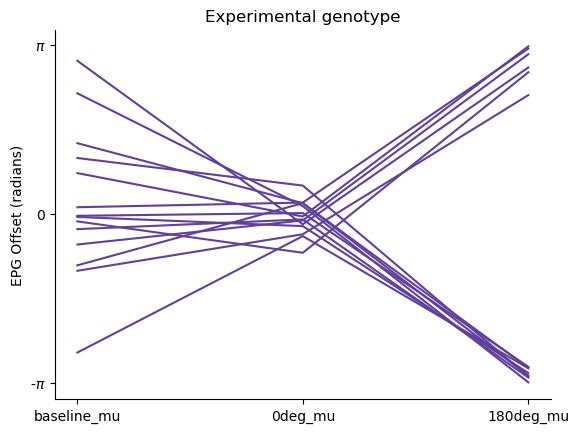

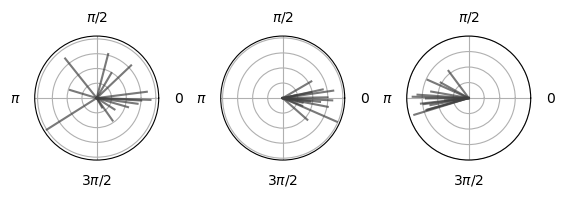

In [6]:
fig, ax= plt.subplots()

_ = ax.plot(remap_data[['baseline_mu','0deg_mu','180deg_mu']].T, color=plt.cm.Purples(.8))
ax.set_ylabel('EPG Offset (radians)')
ax.set_title('Experimental genotype')
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.set_yticks([-np.pi, 0, np.pi], labels=[r'-$\pi$', 0, r'$\pi$'])
fig.savefig(figfolder / "EL_remap.pdf")

fig, ax = plt.subplots(1,3,subplot_kw={'projection': 'polar'})
fig.subplots_adjust(wspace=.5)
for index,row in remap_data.iterrows():
    ax[0].plot(row['baseline_mu']*np.ones([2,]), [0, row['baseline_r']], color=plt.cm.Greys(.8), alpha=.7)
    ax[1].plot(row['0deg_mu']*np.ones([2,]), [0, row['0deg_r']], color=plt.cm.Greys(.8), alpha=.7)
    ax[2].plot(row['180deg_mu']*np.ones([2,]), [0, row['180deg_r']], color=plt.cm.Greys(.8), alpha=.7)


    
for a in ax:
    a.set_xticks([0, np.pi/2, np.pi, 3*np.pi/2], ['0', r'$\pi$/2', r'$\pi$', r'3$\pi$/2'])
    a.set_yticks([0,.2,.4,.6,.8],['','','','',''])

fig.savefig(figfolder / 'EL_remap_polar.pdf')

In [7]:
no_chrimson_sess_df = sess_df[sess_df['condition']=='no_chrimson']
flies = no_chrimson_sess_df['fly_id'].unique()
print(flies.shape)

no_chr_data = {'fly': [],
              'baseline_mu':[],
              'baseline_var':[],
              'baseline_r':[],
              '0deg_mu':[],
              '0deg_var':[],
              '0deg_r': [],
              '180deg_mu':[],
              '180deg_var':[],
              '180deg_r':[],
             }

for fly in flies:
    _df = sess_df['fly_id']==fly
    no_chr_data['fly'].append(fly)
    
    baseline = sess_df.loc[(sess_df['fly_id']==fly) & (sess_df['scan_type']=='baseline')]
    no_chr_data['baseline_mu'].append(baseline['mean offset'].mean())
    no_chr_data['baseline_var'].append(baseline['offset var.'].mean())
    no_chr_data['baseline_r'].append(baseline['mean vec. len'].mean())
    
    deg0 = sess_df.loc[(sess_df['fly_id']==fly) & (sess_df['scan_type']=='post_0deg')]
    no_chr_data['0deg_mu'].append(deg0['mean offset'].mean())
    no_chr_data['0deg_var'].append(deg0['offset var.'].mean())
    no_chr_data['0deg_r'].append(baseline['mean vec. len'].mean())
    
    deg180 = sess_df.loc[(sess_df['fly_id']==fly) & (sess_df['scan_type']=='post_180deg')]
    no_chr_data['180deg_mu'].append(deg180['mean offset'].mean())
    no_chr_data['180deg_var'].append(deg180['offset var.'].mean())
    no_chr_data['180deg_r'].append(baseline['mean vec. len'].mean())
    

no_chr_data = pd.DataFrame(no_chr_data)
no_chr_data.head()

(10,)


,fly,baseline_mu,baseline_var,baseline_r,0deg_mu,0deg_var,0deg_r,180deg_mu,180deg_var,180deg_r
0,06_08_2024_fly1_no_chrimson,0.552767,0.510886,0.489114,1.338252,0.583697,0.489114,1.095575,0.629084,0.489114
1,06_08_2024_fly2_no_chrimson,-0.056294,0.563482,0.436518,0.485170,0.453243,0.436518,-0.216174,0.562937,0.436518
2,07_08_2024_fly1_no_chrimson,0.710670,0.523080,0.476920,0.713438,0.565265,0.476920,NaN,NaN,0.476920
3,07_08_2024_fly2_no_chrimson,-0.115083,0.729579,0.270421,-0.166178,0.420367,0.270421,0.447827,0.696582,0.270421
4,08_08_2024_fly2_no_chrimson,-2.728460,0.601773,0.398227,3.108862,0.512903,0.398227,-2.969893,0.395829,0.398227


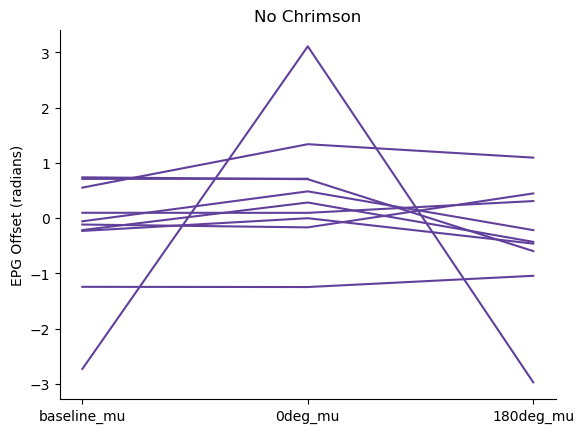

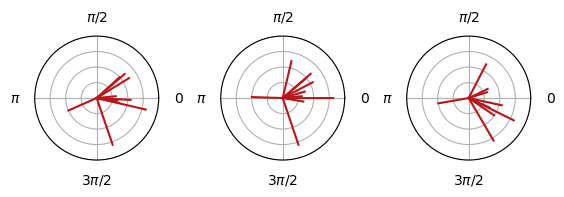

In [8]:
fig, ax= plt.subplots()
_ = ax.plot(no_chr_data[['baseline_mu','0deg_mu','180deg_mu']].T, color=plt.cm.Purples(.8))
ax.set_ylabel('EPG Offset (radians)')
ax.set_title('No Chrimson')
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
fig.savefig(figfolder / "EL_no_chr.pdf")

fig, ax = plt.subplots(1,3,subplot_kw={'projection': 'polar'})
fig.subplots_adjust(wspace=.5)
for index,row in no_chr_data.iterrows():
    ax[0].plot(row['baseline_mu']*np.ones([2,]), [0, row['baseline_r']], color=plt.cm.Reds(.8))
    ax[1].plot(row['0deg_mu']*np.ones([2,]), [0, row['0deg_r']], color=plt.cm.Reds(.8))
    ax[2].plot(row['180deg_mu']*np.ones([2,]), [0, row['180deg_r']], color=plt.cm.Reds(.8))
    

    
for a in ax:
    a.set_xticks([0, np.pi/2, np.pi, 3*np.pi/2], ['0', r'$\pi$/2', r'$\pi$', r'3$\pi$/2'])
    a.set_yticks([0,.2,.4,.6,.8],['','','','',''])
    
fig.savefig(figfolder / 'EL_no_chr_polar.pdf')

In [9]:
novis_sess_df = sess_df[sess_df['condition']=='novis_control']
flies = novis_sess_df['fly_id'].unique()
print(flies.shape)

novis_data = {'fly': [],
              'baseline_mu':[],
              'baseline_var':[],
              'baseline_r':[],
              '1_mu':[],
              '1_var':[],
              '1_r':[],
              '2_mu':[],
              '2_var':[],
              '2_r':[],
             }

for fly in flies:
    _df = sess_df['fly_id']==fly
    novis_data['fly'].append(fly)
    
    baseline = sess_df.loc[(sess_df['fly_id']==fly) & (sess_df['scan_type']=='baseline')]
    novis_data['baseline_mu'].append(baseline['mean offset'].mean())
    novis_data['baseline_var'].append(baseline['offset var.'].mean())
    novis_data['baseline_r'].append(baseline['mean vec. len'].mean())
    
    post1 = sess_df.loc[(sess_df['fly_id']==fly) & (sess_df['scan_type']=='post_novis1')]
    novis_data['1_mu'].append(post1['mean offset'].mean())
    novis_data['1_var'].append(post1['offset var.'].mean())
    novis_data['1_r'].append(baseline['mean vec. len'].mean())
    
    post2 = sess_df.loc[(sess_df['fly_id']==fly) & (sess_df['scan_type']=='post_novis2')]
    novis_data['2_mu'].append(post2['mean offset'].mean())
    novis_data['2_var'].append(post2['offset var.'].mean())
    novis_data['2_r'].append(baseline['mean vec. len'].mean())
    
novis_data = pd.DataFrame(novis_data)
novis_data

(10,)


,fly,baseline_mu,baseline_var,baseline_r,1_mu,1_var,1_r,2_mu,2_var,2_r
0,02_08_2024_fly3_novis_control,-2.519135,0.665476,0.334524,-2.392893,0.493748,0.334524,-1.863593,0.268071,0.334524
1,02_08_2024_fly5_novis_control,-2.005584,0.630964,0.369036,-1.625168,0.496221,0.369036,-2.350126,0.689957,0.369036
2,05_08_2024_fly1_novis_control,-2.972607,0.638810,0.361190,-2.111069,0.428914,0.361190,-1.258125,0.489941,0.361190
3,05_08_2024_fly4_novis_control,1.708468,0.262024,0.737976,0.203322,0.409121,0.737976,1.694335,0.806969,0.737976
4,06_08_2024_fly2_novis_control,-2.401924,0.591162,0.408838,-1.628358,0.526488,0.408838,2.827509,0.879294,0.408838
5,09_08_2024_fly1_novis_control,-1.104598,0.449260,0.550740,-1.519087,0.438917,0.550740,-1.525783,0.719140,0.550740
6,09_08_2024_fly2_novis_control,2.420155,0.237535,0.762465,1.503155,0.752760,0.762465,0.322325,0.682771,0.762465
7,26_08_2024_fly1_novis_control,-0.239091,0.381542,0.618458,0.474676,0.629097,0.618458,0.563011,0.567738,0.618458
8,26_08_2024_fly2_novis_control,-0.320766,0.680721,0.319279,0.309595,0.401670,0.319279,0.822009,0.385699,0.319279
9,26_08_2024_fly3_novis_control,0.284917,0.383032,0.616968,-0.452026,0.481670,0.616968,0.059809,0.400369,0.616968


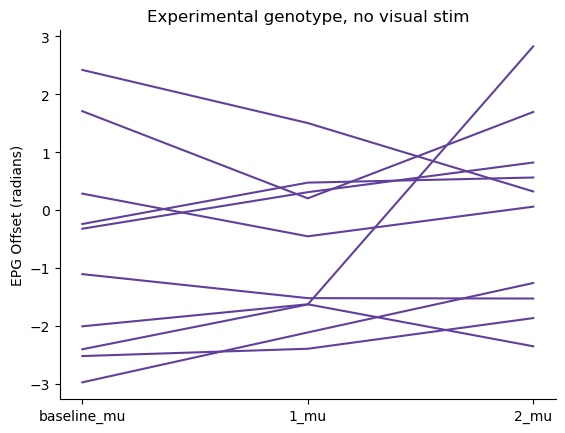

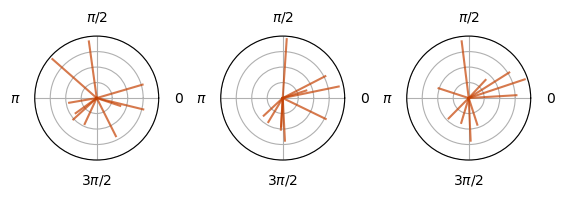

In [10]:
fig, ax= plt.subplots()
_ = ax.plot(novis_data[['baseline_mu','1_mu','2_mu']].T, color=plt.cm.Purples(.8))
ax.set_ylabel('EPG Offset (radians)')
ax.set_title('Experimental genotype, no visual stim')

ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
fig.savefig(figfolder / "EL_novis.pdf")


fig, ax = plt.subplots(1,3,subplot_kw={'projection': 'polar'})
fig.subplots_adjust(wspace=.5)
for index,row in novis_data.iterrows():
    ax[0].plot(row['baseline_mu']*np.ones([2,]), [0, row['baseline_r']], color=plt.cm.Oranges(.8),alpha=.7)
    ax[1].plot(row['1_mu']*np.ones([2,]), [0, row['1_r']], color=plt.cm.Oranges(.8),alpha=.7)
    ax[2].plot(row['2_mu']*np.ones([2,]), [0, row['2_r']], color=plt.cm.Oranges(.8),alpha=.7)
    
# for index,row in no_chr_data.iterrows():
#     ax[0].plot(row['baseline_mu']*np.ones([2,]), [0, row['baseline_r']], color=plt.cm.cool(.8),alpha=.7)
#     ax[1].plot(row['0deg_mu']*np.ones([2,]), [0, row['0deg_r']], color=plt.cm.cool(.8),alpha=.7)
#     ax[2].plot(row['180deg_mu']*np.ones([2,]), [0, row['180deg_r']], color=plt.cm.cool(.8),alpha=.7)
    

    

    
for a in ax:
    a.set_xticks([0, np.pi/2, np.pi, 3*np.pi/2], ['0', r'$\pi$/2', r'$\pi$', r'3$\pi$/2'])
    a.set_yticks([0,.2,.4,.6,.8],['','','','',''])
    
fig.savefig(figfolder / 'EL_novis_polar.pdf')

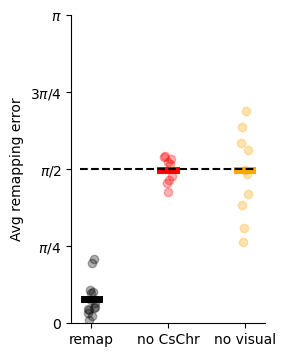

In [11]:
def avg_diff(data):
    try:
        diff0 = np.abs(data['0deg_mu'])
        diff180 = np.abs(np.pi-data['180deg_mu'])
        diff180 = np.minimum(diff180, 2*np.pi-diff180)
    except:
        diff0 = np.abs(data['1_mu'])
        diff180 = np.abs(np.pi-data['2_mu'])
        diff180 = np.minimum(diff180, 2*np.pi-diff180)
    return (diff0+diff180)/2

fig, ax= plt.subplots(1,1,figsize=[2.5,4])
remap_mu = avg_diff(remap_data)
ax.scatter(np.linspace(0,.1, num = remap_data.shape[0]),remap_mu, color='black',alpha=.3)
ax.plot([-.05,.15], remap_mu.mean()*np.ones([2,]), color='black', linewidth=5)


no_chr_mu = avg_diff(no_chr_data)
ax.scatter(np.linspace(1,1.1, num = no_chr_data.shape[0]),no_chr_mu, color='red',alpha=.3)
ax.plot([.95,1.15], no_chr_mu.mean()*np.ones([2,]), color='red', linewidth=5)

novis_mu = avg_diff(novis_data)
ax.scatter(np.linspace(2,2.1, num = novis_data.shape[0]),novis_mu, color='orange',alpha=.3)
ax.plot([1.95,2.15], no_chr_mu.mean()*np.ones([2,]), color='orange', linewidth=5)


ax.plot([-.1,2.2],np.pi/2*np.ones([2,]), 'k--')
ax.set_ylim([0,np.pi])

ax.set_xticks([.05,1.05, 2.05], labels=['remap', 'no CsChr', 'no visual'])
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.set_ylabel('Avg remapping error')
_ = ax.set_yticks([0,np.pi/4,np.pi/2,3*np.pi/4, np.pi], labels=[0, r"$\pi$/4", r"$\pi$/2", r"$3\pi$/4", r"$\pi$"])

fig.savefig(figfolder / 'EL_remapping_error.pdf')

# fig, ax= plt.subplots()
# ax.scatter(np.zeros([remap_data.shape[0],]),np.abs(remap_data['0deg_mu']), color='black')
# diff = np.abs(np.pi-remap_data['180deg_mu'])
# ax.scatter(np.zeros([remap_data.shape[0],])+.1, np.minimum(diff, 2*np.pi-diff),color='black')


# ax.scatter(np.zeros([no_chr_data.shape[0],])+1, np.abs(no_chr_data['0deg_mu']), color='orange')
# diff = np.abs(np.pi-no_chr_data['180deg_mu'])
# ax.scatter(np.zeros([no_chr_data.shape[0],])+1.1, np.minimum(diff, 2*np.pi-diff),color='orange')



# ax.scatter(np.zeros([novis_data.shape[0],])+2, np.abs(novis_data['1_mu']), color='red')
# diff = np.abs(np.pi-novis_data['2_mu'])
# ax.scatter(np.zeros([novis_data.shape[0],])+2.1, np.minimum(diff, 2*np.pi-diff),color='red')


# ax.set_ylim([-.1,3.24])

# _ = ax.plot(remap_data[['baseline_mu','0deg_mu','180deg_mu']].T, color=plt.cm.Purples(.8))

In [12]:
def get_ts(pp, coef = 0):
    y_epg = pp.timeseries['rois_z']
    heading = -1*pp.voltage_recording_aligned[' Heading'].to_numpy()
    bar_vis_mask = np.abs(heading)>1.5
   
    y_epg_sm = sp.ndimage.gaussian_filter1d(sp.ndimage.gaussian_filter1d(y_epg-1, 2, axis=-1),.7,axis=1, mode='wrap')
    
    
    n_rois = y_epg.shape[1]
    x_f,y_f = st2p.utilities.pol2cart(y_epg[-1,:,:] ,np.linspace(-np.pi,np.pi,num=n_rois)[:,np.newaxis])
    rho_epg, phi_epg = st2p.utilities.cart2pol(x_f.mean(axis=0), y_f.mean(axis=0))


    _,offset_epg = st2p.utilities.cart2pol(*st2p.utilities.pol2cart(np.ones(heading.shape),phi_epg-heading))

    
    return {'heading': heading,
            'bar_vis_mask': bar_vis_mask,
            'y_epg': y_epg,
            'y_epg_sm': y_epg_sm,
            'rho_epg': rho_epg,
            'phi_epg': phi_epg,
            'offset_epg': offset_epg}


def align_to_heading(ts):
    heading_bins = np.linspace(-np.pi, np.pi, num=17)
    heading_dig = np.digitize(ts['heading'], heading_bins)-1

    y_h_aligned = np.zeros([1,*ts['y_epg'].shape[1:]])
    for ind in range(ts['heading'].shape[0]):
        y_h_aligned[-1,:,ind] = np.roll(ts['y_epg'][-1,:,ind], -heading_dig[ind])
        # y_h_aligned[1,:,ind] = np.roll(ts['y_epg'][1,:,ind], -heading_dig[ind])
       
        
    y_h_aligned_z = np.zeros((1,16,16))
    for b in range(16):
        mask = heading_dig==b
        y_h_aligned_z[:,:,b] = y_h_aligned[:,:,mask].mean(axis=-1)
    
    
    return heading_bins, y_h_aligned, y_h_aligned_z



/tmp/ipykernel_762119/2713488506.py:14: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots(3,3,figsize=(20,6),sharey=True)
/tmp/ipykernel_762119/569453242.py:39: RuntimeWarning: Mean of empty slice.
  y_h_aligned_z[:,:,b] = y_h_aligned[:,:,mask].mean(axis=-1)


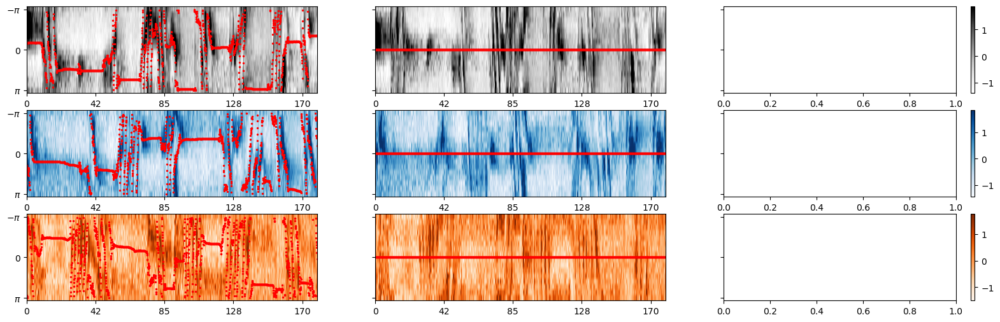

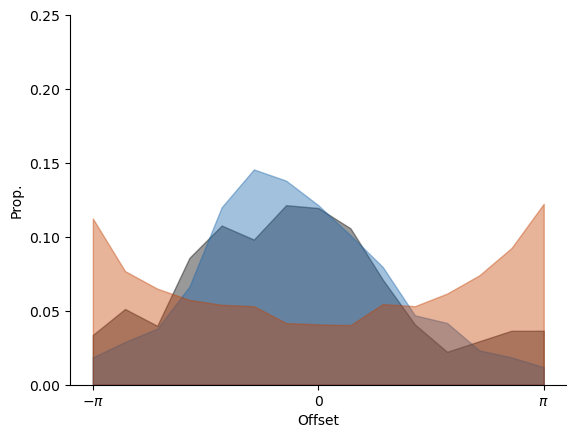

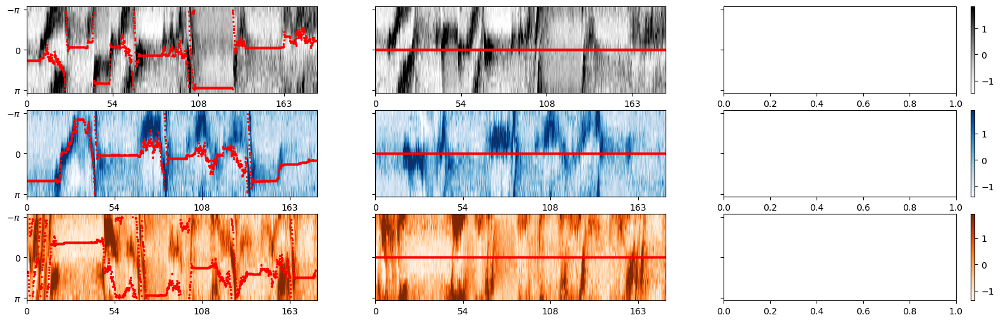

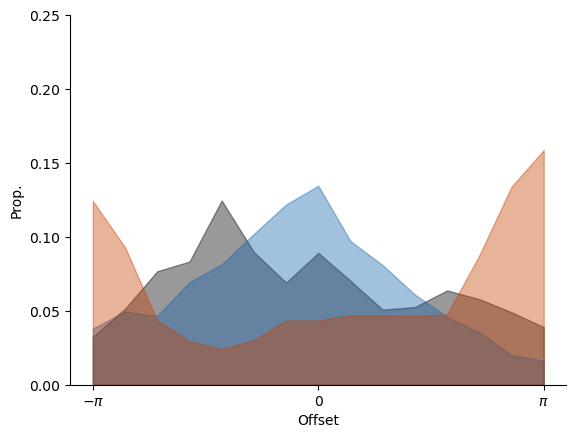

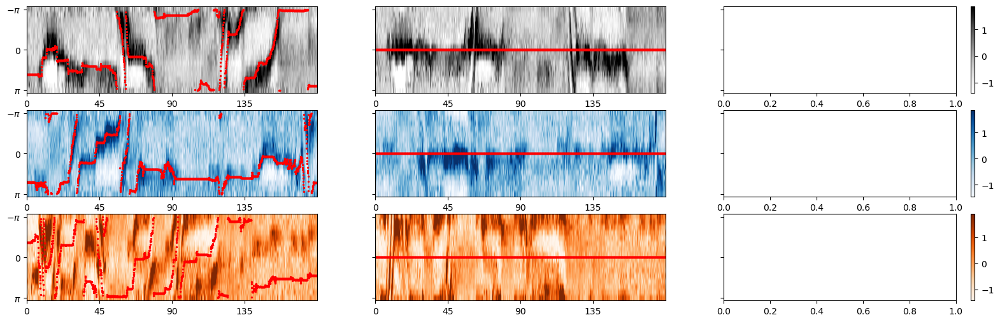

...

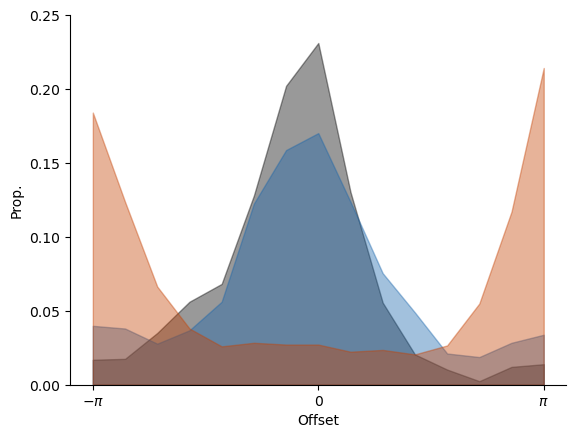

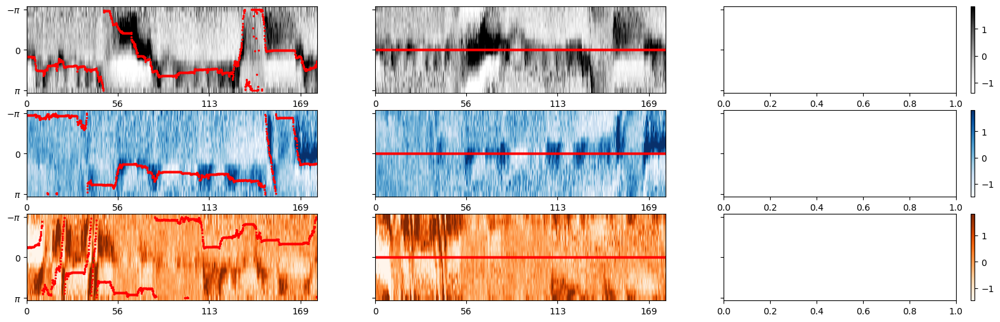

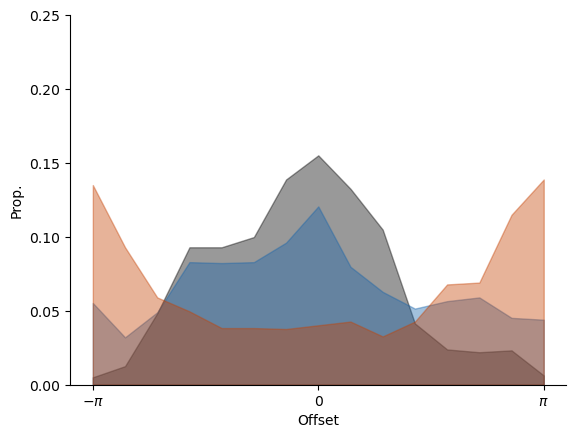

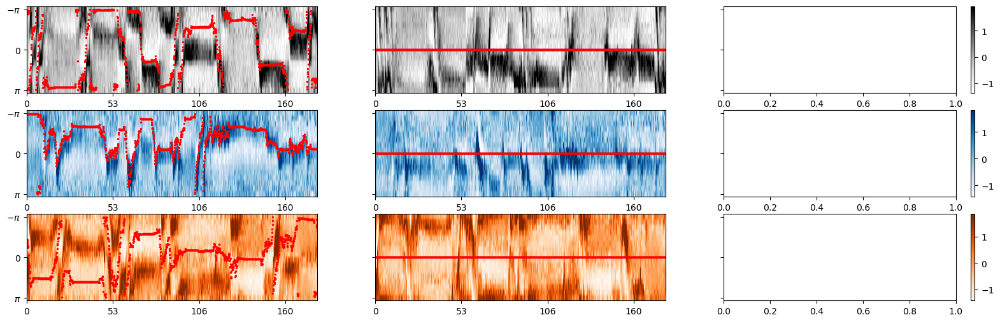

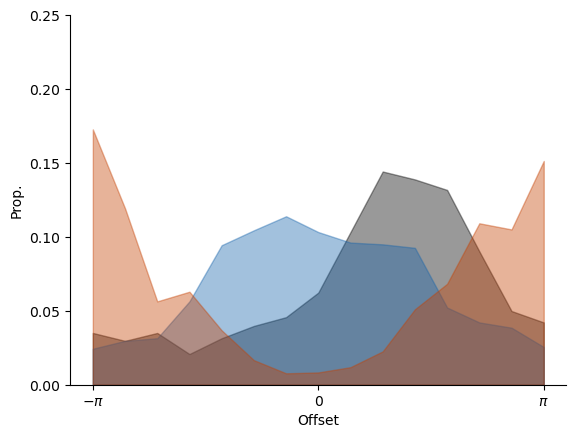

In [17]:
remap_sess_df = sess_df[sess_df['condition']=='remap']
flies = remap_sess_df['fly_id'].unique()


bins = np.arange(16)
edges = np.linspace(-np.pi, np.pi, num=16)
window = slice(0,10000)
centers = (edges[:-1]+edges[1:])/2
    
for fly in flies:
    _df = remap_sess_df['fly_id']==fly
    # remap_data['fly'].append(fly)
    
    fig, ax = plt.subplots(3,3,figsize=(20,6),sharey=True)
    fig_hist, ax_hist = plt.subplots()

    ##
    baseline = sess_df.loc[(sess_df['fly_id']==fly) & (sess_df['scan_type']=='baseline')].iloc[0]
    # print(baseline.iloc[0])
    outdir = pathlib.PurePath( basedir / baseline['condition'] / baseline['date'] / baseline['fly'] / baseline['sess'] / 'preprocess.pkl')
    pp = st2p.preprocessing.EBImagingSession.from_file(outdir)
    ts = get_ts(pp,coef=0)
    
    h = ax[0,0].imshow(ts['y_epg'][-1,:,window],aspect='auto',cmap='Greys', 
                     vmin=np.percentile(ts['y_epg'][-1,:,:],5), 
                     vmax=np.percentile(ts['y_epg'][-1,:,:],95))
    
    plt.colorbar(h, ax=ax[0,2])
    
    heading = 15*(np.angle(np.exp(1j*(ts['heading']-np.pi)))+np.pi)/2/np.pi
    t = np.arange(ts['heading'].shape[-1])
    ax[0,0].scatter(t, heading, s=2, color='red')
    
    # time = 
    time = np.array(pp.metadata['frame_times']).mean(axis=-1)
    ax[0,0].set_xticks(t[::500],labels=[int(_t) for _t in time[::500]])
    ax[0,0].set_yticks([0, 7.5, 15], labels=[r'$-\pi$', 0, r'$\pi$'])
    
    
    heading_bins, y_h_aligned, y_h_aligned_z = align_to_heading(ts)
    h = ax[0,1].imshow(y_h_aligned[-1,:,window], aspect='auto',cmap='Greys', 
                 vmin=np.percentile(ts['y_epg'][-1,:,:],5), 
                 vmax=np.percentile(ts['y_epg'][-1,:,:],95))
    ax[0,1].scatter(t,7.5*np.ones_like(heading), s=2, color='red')
    
    ax[0,1].set_xticks(t[::500],labels=[int(_t) for _t in time[::500]])
    
    hist, _ = np.histogram(ts['offset_epg'], bins = np.linspace(-np.pi,np.pi,num=16))
    hist = np.roll(hist,-8)
    ax_hist.fill_between(centers, hist/hist.sum(), alpha=.4, color='black')
    ax_hist.set_xticks([centers[0], 0, centers[-1]], labels=[r'$-\pi$', 0, r'$\pi$'])
    # ax_hist.set_xlim([-1,16])
    ##
    
    ##
    post0 = sess_df.loc[(sess_df['fly_id']==fly) & (sess_df['scan_type']=='post_0deg')].iloc[0]
    outdir = pathlib.PurePath( basedir / post0['condition'] / post0['date'] / post0['fly'] / post0['sess'] / 'preprocess.pkl')
    pp = st2p.preprocessing.EBImagingSession.from_file(outdir)
    ts = get_ts(pp,coef=0)
    
    h = ax[1,0].imshow(ts['y_epg'][-1,:,window],aspect='auto',cmap='Blues', 
                     vmin=np.percentile(ts['y_epg'][-1,:,:],5), 
                     vmax=np.percentile(ts['y_epg'][-1,:,:],95))
    plt.colorbar(h, ax=ax[1,2])


    heading = 15*(np.angle(np.exp(1j*(ts['heading']-np.pi)))+np.pi)/2/np.pi
    t = np.arange(ts['heading'].shape[-1])
    ax[1,0].scatter(t, heading, s=2, color='red')
    
    time = np.array(pp.metadata['frame_times']).mean(axis=-1)
    ax[1,0].set_xticks(t[::500],labels=[int(_t) for _t in time[::500]])
    
    heading_bins, y_h_aligned, y_h_aligned_z = align_to_heading(ts)
    h = ax[1,1].imshow(y_h_aligned[-1,:,window], aspect='auto',cmap='Blues', 
                 vmin=np.percentile(ts['y_epg'][-1,:,:],5), 
                 vmax=np.percentile(ts['y_epg'][-1,:,:],95))
    ax[1,1].scatter(t,7.5*np.ones_like(heading), s=2, color='red')
    time = np.array(pp.metadata['frame_times']).mean(axis=-1)
    ax[1,1].set_xticks(t[::500],labels=[int(_t) for _t in time[::500]])
    
    hist, _ = np.histogram(ts['offset_epg'], bins = np.linspace(-np.pi,np.pi,num=16))
    hist = np.roll(hist,-8)
    ax_hist.fill_between(centers, hist/hist.sum(), alpha=.4, color=plt.cm.Blues(.8))
    ##
    
    ##
    post180 = sess_df.loc[(sess_df['fly_id']==fly) & (sess_df['scan_type']=='post_180deg')].iloc[0]
    outdir = pathlib.PurePath( basedir / post180['condition'] / post180['date'] / post180['fly'] / post180['sess'] / 'preprocess.pkl')
    pp = st2p.preprocessing.EBImagingSession.from_file(outdir)
    ts = get_ts(pp,coef=0)
    
    
    h = ax[2,0].imshow(ts['y_epg'][-1,:,window],aspect='auto',cmap='Oranges', 
                     vmin=np.percentile(ts['y_epg'][-1,:,:],5), 
                     vmax=np.percentile(ts['y_epg'][-1,:,:],95))
    plt.colorbar(h, ax=ax[2,2])
    heading = 15*(np.angle(np.exp(1j*(ts['heading']-np.pi)))+np.pi)/2/np.pi
    t = np.arange(ts['heading'].shape[-1])
    ax[2,0].scatter(t, heading, s=2, color='red')
    time = np.array(pp.metadata['frame_times']).mean(axis=-1)
    ax[2,0].set_xticks(t[::500],labels=[int(_t) for _t in time[::500]])
    
    heading_bins, y_h_aligned, y_h_aligned_z = align_to_heading(ts)
    h = ax[2,1].imshow(y_h_aligned[-1,:,window], aspect='auto',cmap='Oranges', 
                 vmin=np.percentile(ts['y_epg'][-1,:,:],5), 
                 vmax=np.percentile(ts['y_epg'][-1,:,:],95))
    time = np.array(pp.metadata['frame_times']).mean(axis=-1)
    ax[2,1].set_xticks(t[::500],labels=[int(_t) for _t in time[::500]])
    ax[2,1].scatter(t,7.5*np.ones_like(heading), s=2, color='red')
    
    hist, _ = np.histogram(ts['offset_epg'], bins = np.linspace(-np.pi,np.pi,num=16))
    hist = np.roll(hist,-8)
    ax_hist.fill_between(centers, hist/hist.sum(), alpha=.4, color=plt.cm.Oranges(.8))
    ##
    
    ax_hist.set_ylim([0,.25])
    ax_hist.spines['top'].set_visible(False)
    ax_hist.spines['right'].set_visible(False)
    ax_hist.set_xlabel('Offset')
    ax_hist.set_ylabel('Prop.')
    
    
    fig.savefig(figfolder / f"EL_{fly}_heatmaps.pdf")
    fig_hist.savefig(figfolder / f"EL_{fly}_hist.pdf")
    # fig.savefig(figfolder / 'EL_novis_polar.pdf')